# Euler Method with Small Angle Approximation $\sin \theta \approx \theta$

## Implementation 1 (Traditional)

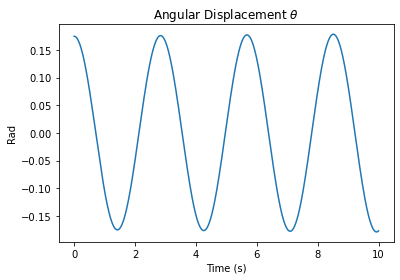

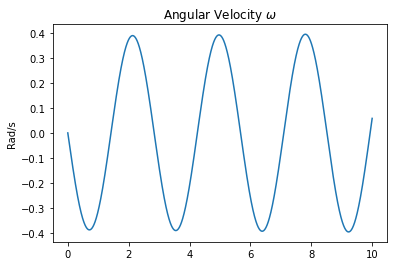

In [96]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

g = 9.8
L = 2

def thetadot(theta, omega):
    return omega

def omegadot(theta, omega):
    return -(g/L) * theta

inic = [np.radians(10), 0]

phase = inic # theta, omega
phases = [phase]

dt = 0.001
t = [0]

while t[-1] < 10:
    theta_next = phase[0] + thetadot(*phase) * dt
    omega_next = phase[1] + omegadot(*phase) * dt
    
    phase = [theta_next, omega_next]

    phases.append(phase)
    t.append(t[-1] + dt)
    
theta = [elem[0] for elem in phases]
omega = [elem[1] for elem in phases]

plt.xlabel("Time (s)")

plt.plot(t, theta)
plt.title(r"Angular Displacement $\theta$")
plt.ylabel("Rad")
plt.show()

plt.plot(t, omega)
plt.title(r"Angular Velocity $\omega$")
plt.ylabel("Rad/s")
plt.show()

## Implementation 2 (Numpy arrays)

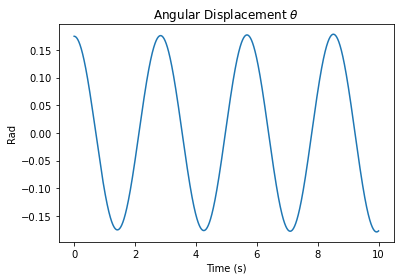

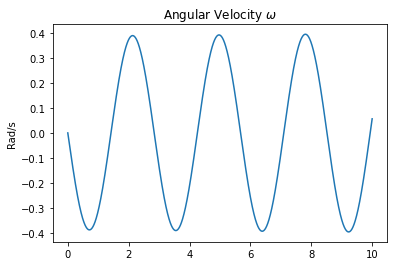

In [97]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

g = 9.8
L = 2

def thetadot(omega):
    return omega

def omegadot(theta):
    return -(g/L) * theta

def dot(theta, omega):
    return np.array([thetadot(omega), omegadot(theta)])

inic = [np.radians(10), 0]

phase = np.array(inic) # theta, omega
phases = []

dt = 0.001
t = np.arange(0, 10, dt)

for time in t:
    phases.append(phase)
    
    phase = phase + dot(*phase) * dt

theta = [elem[0] for elem in phases]
omega = [elem[1] for elem in phases]

plt.xlabel("Time (s)")

plt.plot(t, theta)
plt.title(r"Angular Displacement $\theta$")
plt.ylabel("Rad")
plt.show()

plt.plot(t, omega)
plt.title(r"Angular Velocity $\omega$")
plt.ylabel("Rad/s")
plt.show()


# Runge-Kutta 4 with Small Angle Approximation $\sin \theta \approx \theta$

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


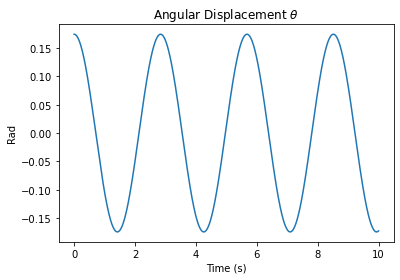

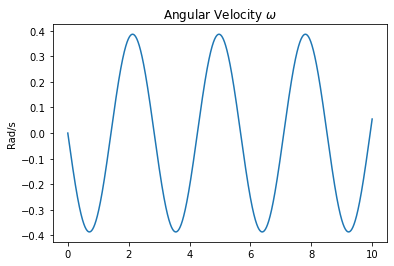

In [101]:
%reset

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

g = 9.8
L = 2

def thetadot(omega):
    return omega

def omegadot(theta):
    return -(g/L) * theta

def dot(theta, omega):
    return np.array([thetadot(omega), omegadot(theta)])

inic = [np.radians(10), 0]

phase = np.array(inic) # theta, omega
phases = []

dt = 0.001
t = np.arange(0, 10, dt)

for time in t:
    phases.append(phase)
    
    K1 = dt * dot(*phase) # Euler iteration, returns (theta_next, omega_next)
    
#     K2 = dt * dot(phase[0] + K1[0]/2, phase[1] + K1[1]/2)
#     K3 = dt * dot(phase[0] + K2[0]/2, phase[1] + K2[1]/2)
#     K4 = dt * dot(phase[0] + K3[0], phase[1] + K3[1])
    
    K2 = dt * dot(*(phase + K1/2))
    K3 = dt * dot(*(phase + K2/2))
    K4 = dt * dot(*(phase + K3))

    phase = phase + K1/6 + K2/3 + K3/3 + K4/6

theta = [elem[0] for elem in phases]
omega = [elem[1] for elem in phases]

plt.xlabel("Time (s)")

plt.plot(t, theta)
plt.title(r"Angular Displacement $\theta$")
plt.ylabel("Rad")
plt.show()

plt.plot(t, omega)
plt.title(r"Angular Velocity $\omega$")
plt.ylabel("Rad/s")
plt.show()

# Runge-Kutta 4 without Small Angle Approximation

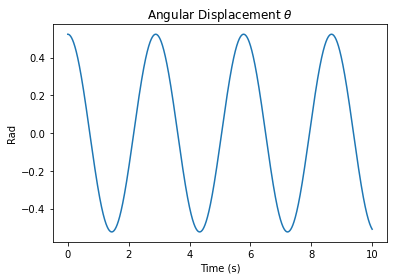

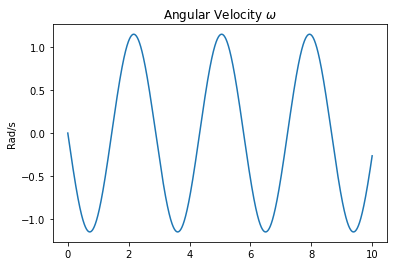

In [57]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

g = 9.8
L = 2

def thetadot(omega):
    return omega

def omegadot(theta):
    return -(g/L) * np.sin(theta)

def dot(theta, omega):
    return np.array([thetadot(omega), omegadot(theta)])

inic = [np.radians(30), 0]

phase = np.array(inic) # theta, omega
phases = []

dt = 0.001
t = np.arange(0, 10, dt)

for time in t:
    phases.append(phase) # append phase at start as arange already contains initial in time (0)

    K1 = dt * dot(*phase) # Euler iteration, returns (theta_next, omega_next)

#     K2 = dt * dot(phase[0] + K1[0]/2, phase[1] + K1[1]/2)
#     K3 = dt * dot(phase[0] + K2[0]/2, phase[1] + K2[1]/2)
#     K4 = dt * dot(phase[0] + K3[0], phase[1] + K3[1])

    K2 = dt * dot(*(phase + K1/2))
    K3 = dt * dot(*(phase + K2/2))
    K4 = dt * dot(*(phase + K3))

    phase = phase + K1/6 + K2/3 + K3/3 + K4/6

theta = [elem[0] for elem in phases]
omega = [elem[1] for elem in phases]

plt.xlabel("Time (s)")

plt.plot(t, theta)
plt.title(r"Angular Displacement $\theta$")
plt.ylabel("Rad")
plt.show()

plt.plot(t, omega)
plt.title(r"Angular Velocity $\omega$")
plt.ylabel("Rad/s")
plt.show()

# Runge-Kutta 4 without SAA animated

<IPython.core.display.Javascript object>


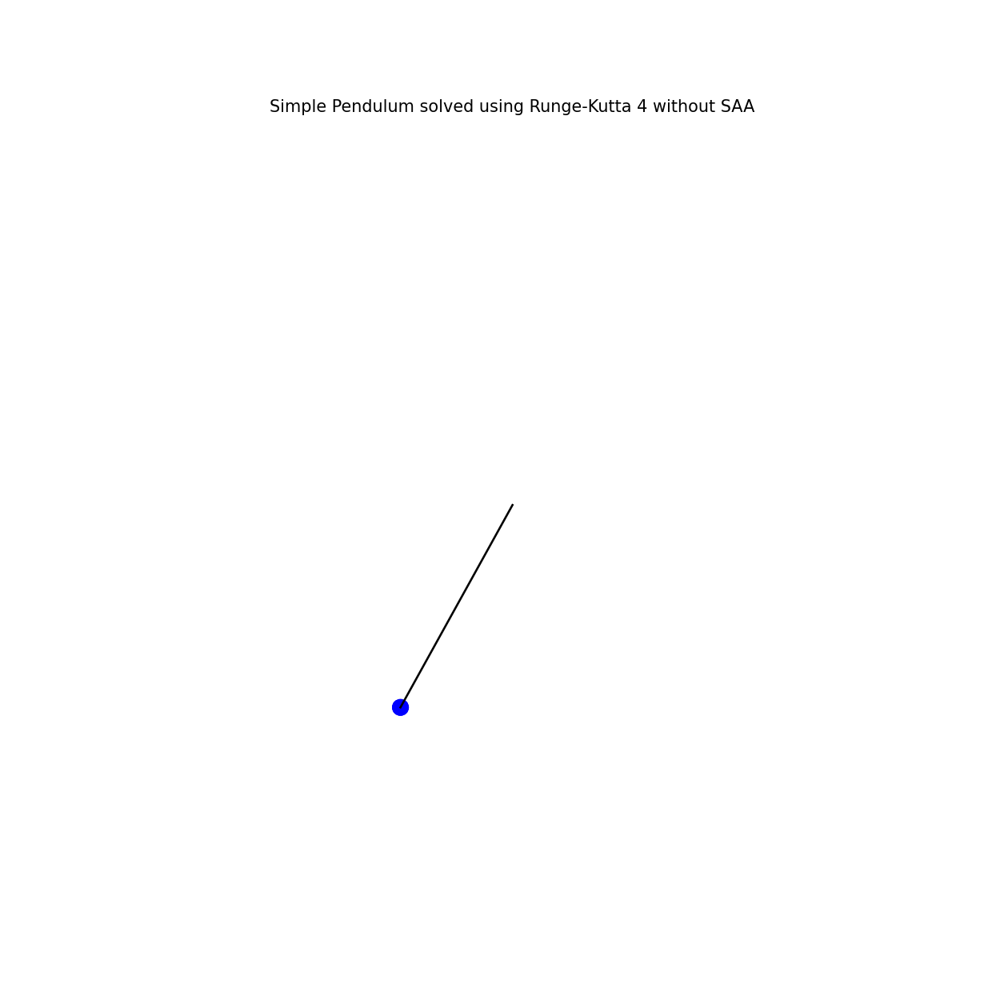

In [1]:
%matplotlib notebook

# Solving the Differential Equation
import numpy as np

def thetadot(omega):
    return omega

def omegadot(theta):
    return -(g/L) * np.sin(theta)

def dot(theta, omega):
    return np.array([thetadot(omega), omegadot(theta)])

g = 9.81
L = 0.3

inic = [np.radians(30), 0]
phase = np.array(inic) # theta, omega
phases = []

dt = 0.001
t = np.arange(0, 10, dt)

for time in t:
    phases.append(phase) # append phase at start as arange already contains initial in time (0)

    K1 = dt * dot(*phase) # Euler iteration, returns (theta_next, omega_next)
    K2 = dt * dot(*(phase + K1/2))
    K3 = dt * dot(*(phase + K2/2))
    K4 = dt * dot(*(phase + K3))

    phase = phase + K1/6 + K2/3 + K3/3 + K4/6

theta = [elem[0] for elem in phases]
omega = [elem[1] for elem in phases]

# Animation
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

fig = plt.gcf()
fig.set_size_inches(10, 10)

origin = np.array([1/2, 1/2])

ax = plt.gca()

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_position('zero')
ax.spines['left'].set_position('zero')
ax.spines['right'].set_color('none')
ax.set(ylim=(0, 1))
ax.set(xlim=(0, 1))

plt.title("Simple Pendulum solved using Runge-Kutta 4 without SAA")
plt.axis('off')

def get_line_coords(start, end):
    x = [coord[0] for coord in [start, end]]
    y = [coord[1] for coord in [start, end]]
    
    return x, y

def bob_position(length, angle):
    return origin + np.array([length * np.sin(angle), -length * np.cos(angle)])

line = ax.plot([], [], color="black")[0]
bob = plt.Circle((0, 0), 0.01, color='b')

patches = [line, bob]

frames = 1000
step = len(theta) // frames
theta_animate = theta[::step]

interval = 1

def init():
    line = patches[0]
    bob = patches[1]
    
    line.set_data(*get_line_coords(origin, bob_position(L, phases[0][0])))
    
    bob.center = bob_position(L, phases[0][0])
    ax.add_patch(bob)
    
    return patches

def animate(frame):
    line = patches[0]
    bob = patches[1]
    
    angle = theta_animate[frame]
    
    line.set_data(*get_line_coords(origin, bob_position(L, angle)))
    
    bob.center = bob_position(L, angle)

    return patches

anim = FuncAnimation(fig, animate, init_func = init, interval = interval, frames = frames, blit=True)

In [19]:
# Display animation using JS

# from IPython.display import HTML
# HTML(anim.to_jshtml())

In [ ]:
# Save animation

anim.save("simple_pendulum_RK4_without_SAA.gif", fps=30)